### BIAS

In [19]:
import pandas as pd
import numpy as np

In [20]:
df = pd.read_json('posts.json')

In [21]:
print(df)

                                           descripcion       fecha
0    👀 DataRobot has some big product news. You won...  13-03-2023
1    We are delighted to co-host an executive forum...  13-03-2023
2    🔑 As you grow and optimize your business with ...  13-03-2023
3    ⏰ We are going live in one hour! Join Brent Hi...  13-03-2023
4    Another awesome breakout session not to be mis...  13-03-2023
..                                                 ...         ...
196  Remember how Dr. Heinz Doofenshmirtz could nev...  29-03-2023
197  Are you a machine learning enthusiast looking ...  29-03-2023
198  Why did the junior developer cross the road?\n...  29-03-2023
199  Experience the Power of AI Angle Tracking for ...  29-03-2023
200  When the boss reminds you that 'It works on my...  29-03-2023

[201 rows x 2 columns]


In [22]:
df["descripcion"]

0      👀 DataRobot has some big product news. You won...
1      We are delighted to co-host an executive forum...
2      🔑 As you grow and optimize your business with ...
3      ⏰ We are going live in one hour! Join Brent Hi...
4      Another awesome breakout session not to be mis...
                             ...                        
196    Remember how Dr. Heinz Doofenshmirtz could nev...
197    Are you a machine learning enthusiast looking ...
198    Why did the junior developer cross the road?\n...
199    Experience the Power of AI Angle Tracking for ...
200    When the boss reminds you that 'It works on my...
Name: descripcion, Length: 201, dtype: object

In [23]:
from gensim.models import KeyedVectors

glove_file = 'glove.6B.50d.txt'
word_vectors = KeyedVectors.load_word2vec_format(glove_file, binary=False, no_header=True)


In [24]:
import numpy as np
from sklearn.decomposition import PCA

# Obtener las palabras y los vectores correspondientes
words = []
vectors = []
for word in word_vectors.key_to_index:
    words.append(word)
    vectors.append(word_vectors[word])
    
# Convertir los vectores en una matriz numpy
X = np.array(vectors)

# Ajustar PCA a los vectores
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(X)

# Imprimir las coordenadas de las palabras en el espacio reducido
for i in range(len(words)):
    print(words[i], X_reduced[i])


the [5.2177515 2.0506272]
, [4.079745  3.0687408]
. [4.607197  2.4399629]
of [5.050267  2.0930114]
to [5.0460362 2.3441708]
and [4.547091 2.685942]
in [5.1704845 1.9082685]
a [5.012128  2.3300562]
" [3.8966706 2.526559 ]
's [4.3467965 3.5039868]
for [5.0204177 2.3885202]
- [4.996046  3.1697204]
that [4.861174 3.190273]
on [5.1283793 2.1412835]
is [4.5020804 2.2979145]
was [4.211706  3.1156826]
said [2.8975854 5.0624514]
with [4.7866006 2.6826515]
he [4.769812  3.2336898]
as [4.5552936 2.5545757]
it [5.2030606 2.2794843]
by [4.0216947 3.3454454]
at [4.9443355 1.9192724]
( [3.7077265 2.257015 ]
) [4.0360355 2.0306199]
from [5.069474  2.0320618]
his [4.5851626 3.4921257]
'' [3.8136773 3.8434546]
`` [4.4702215 3.0709305]
an [4.5207553 2.2229402]
be [4.9850974 2.5376287]
has [4.550819  3.1484072]
are [5.113503  1.8429397]
have [5.226578 2.708174]
but [4.7727118 2.9935813]
were [4.9384513 2.3010306]
not [4.895151  2.8560383]
this [4.9222026 2.3194635]
who [3.9264848 4.0049744]
they [5.297149

In [25]:
from sklearn.cluster import KMeans

# Crear un modelo k-means con 10 clusters
kmeans = KMeans(n_clusters=10)

# Ajustar el modelo a los vectores de palabras reducidos
kmeans.fit(X_reduced)

# Obtener los clusters asignados a cada palabra
labels = kmeans.predict(X_reduced)


c:\Users\wdmoreno\Anaconda3\envs\proba\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


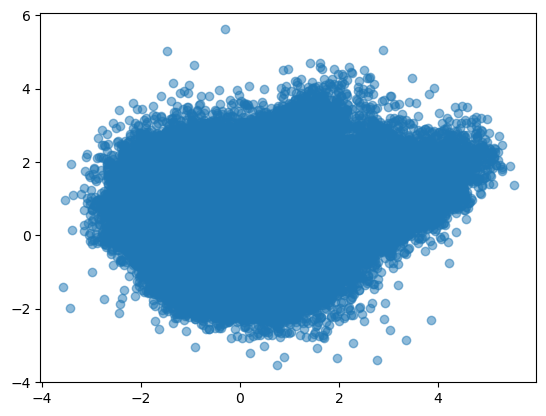

In [26]:
import matplotlib.pyplot as plt

# graficar los puntos originales
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], alpha=0.5)

plt.show()
